In [1]:
!nvidia-smi

Tue May 24 21:49:15 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Upload kaggle api key
from google.colab import files
files.upload()

## Install MMDetection -> restart runtime after to load libs correctly

In [4]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [9]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html
# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full==1.5.0 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git --branch v2.23.0
%cd mmdetection
!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
     |████████████████████████████████| 45.5 MB 3.0 MB/s 
  Attempting uninstall: mmcv-full
    Found existing installation: mmcv-full 1.5.1
    Uninstalling mmcv-full-1.5.1:
      Successfully uninstalled mmcv-full-1.5.1


Cloning into 'mmdetection'...
remote: Enumerating objects: 24744, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 24744 (delta 18), reused 46 (delta 6), pack-reused 24654
Receiving objects: 100% (24744/24744), 37.71 MiB | 13.90 MiB/s, done.
Resolving deltas: 100% (17323/17323), done.
Note: checking out '3e2693151add9b5d6db99b944da020cba837266b'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

/content/mmdetection/mmdetection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection/mmdetection

In [1]:
from mmcv import collect_env
collect_env()

{'CUDA available': True,
 'CUDA_HOME': '/usr/local/cuda',
 'GCC': 'x86_64-linux-gnu-gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0',
 'GPU 0': 'Tesla V100-SXM2-16GB',
 'MMCV': '1.5.0',
 'MMCV CUDA Compiler': '11.1',
 'MMCV Compiler': 'GCC 7.3',
 'NVCC': 'Cuda compilation tools, release 11.1, V11.1.105',
 'OpenCV': '4.1.2',
 'PyTorch': '1.9.0+cu111',
 'PyTorch compiling details': 'PyTorch built with:\n  - GCC 7.3\n  - C++ Version: 201402\n  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications\n  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)\n  - OpenMP 201511 (a.k.a. OpenMP 4.5)\n  - NNPACK is enabled\n  - CPU capability usage: AVX2\n  - CUDA Runtime 11.1\n  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-genco

In [2]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True
2.23.0
11.1
GCC 7.3


# Get Data

In [3]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! mkdir competitionKaggle
! pip install --upgrade --force-reinstall --no-deps kaggle

!kaggle datasets download -p /content/competitionKaggle/ -d heftyjohnson/revisedsigndataset

!unzip /content/competitionKaggle/revisedsigndataset.zip -d /content/competitionKaggle/
!rm /content/competitionKaggle/revisedsigndataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: /content/competitionKaggle/RevisedImages/VX3t3DCakfT8qOmL3XWYNg.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VX4dvlmaGKyABcUEbHMMHw.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VZ5DRb1ThV9eIiTTQecFbA.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VZ6zT4uRTZAKzmghaUctgw.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VZAygd06tV8I8jgrFgt7Wg.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VZkR8LNAS7XIB1P6PSQhvA.jpg  
  inflating: /content/competitionKaggle/RevisedImages/V_Kq2pKKEh5souWX3Asjjw.jpg  
  inflating: /content/competitionKaggle/RevisedImages/V_mgoDHjTf46EUXCn0NclQ.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VaFfIm_svxlOjpiKodpe5w.jpg  
  inflating: /content/competitionKaggle/RevisedImages/VaVrq5SUNwxzA8JsJxjB5g.jpg  
  inflating: /content/competitionKaggle/RevisedImages/Va_T1JihujDLV15ol9uPMQ.jpg  
  inflating: /content/competitionKag

#Download Pretrained models to train on

FASTER RCNN

In [10]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

--2022-05-24 22:37:04--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  7.10MB/s    in 22s     

2022-05-24 22:37:28 (7.18 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]



DETR

In [11]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/detr/detr_r50_8x2_150e_coco/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth \
      -P checkpoints/

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-05-24 22:37:28--  https://download.openmmlab.com/mmdetection/v2.0/detr/detr_r50_8x2_150e_coco/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166698982 (159M) [application/octet-stream]
Saving to: ‘checkpoints/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth’

detr_r50_8x2_150e_c 100%[===================>] 158.98M  8.23MB/s    in 18s     

2022-05-24 22:37:48 (8.66 MB/s) - ‘checkpoints/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth’ saved [166698982/166698982]



YOLO

In [12]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_320_273e_coco/yolov3_d53_320_273e_coco-421362b6.pth \
      -P checkpoints/

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-05-24 22:37:48--  https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_320_273e_coco/yolov3_d53_320_273e_coco-421362b6.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.75.20.18
Connecting to download.openmmlab.com (download.openmmlab.com)|47.75.20.18|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248091419 (237M) [application/octet-stream]
Saving to: ‘checkpoints/yolov3_d53_320_273e_coco-421362b6.pth’

yolov3_d53_320_273e 100%[===================>] 236.60M  9.28MB/s    in 26s     

2022-05-24 22:38:14 (9.11 MB/s) - ‘checkpoints/yolov3_d53_320_273e_coco-421362b6.pth’ saved [248091419/248091419]



# Training

In [46]:
import mmcv
import os
import json
import imageio
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

import mmcv
from mmcv import Config

#copy config if needed
#Faster RCNN
!cp "/content/drive/MyDrive/Group Coursework (80%)/Faster-RCNN_configV2.py" "/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py"
#DETR
!cp "/content/drive/MyDrive/Group Coursework (80%)/DETR_configV2.py" "/content/mmdetection/configs/detr/DETR_config.py"
#YOLO
!cp "/content/drive/MyDrive/Group Coursework (80%)/YOLO_configV2.py" "/content/mmdetection/configs/yolo/YOLO_config.py"

In [47]:
#load config file
%cd /content/mmdetection

#Faster RCNN
# cfg = Config.fromfile("/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py")

#DETR
# cfg = Config.fromfile("/content/mmdetection/configs/detr/DETR_config.py")

#YOLO
cfg = Config.fromfile("/content/mmdetection/configs/yolo/YOLO_config.py")

/content/mmdetection


Test location

In [48]:
cfg.work_dir = "/content/drive/MyDrive/Group Coursework (80%)/Models/Test/"#Test dir

In [49]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import mmcv
import os.path as osp

# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
# model = build_detector(cfg.model)
model = build_detector(cfg.model, train_cfg=cfg.get('train_cfg'))#, test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
print(datasets[0].CLASSES)
Classes = ("yield_sign", "pedestrians_crossing_sign", "no_entry_sign", "chevron_left_sign", "chevron_right_sign", "parking_sign",
         "stop_sign", "60mph_sign", "30mph_sign", "one_way_sign",
         "speed_bump_sign", "no_left_turn_sign", "no_heavy_goods_vehicles_sign", "no_right_turn_sign", "children_sign")
model.CLASSES = Classes#datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
('yield_sign', 'pedestrians_crossing_sign', 'no_entry_sign', 'chevron_left_sign', 'chevron_right_sign', 'parking_sign', 'stop_sign', '60mph_sign', '30mph_sign', 'one_way_sign', 'speed_bump_sign', 'no_left_turn_sign', 'no_heavy_goods_vehicles_sign', 'no_right_turn_sign', 'children_sign')


In [ ]:
# print(cfg.pretty_text)

In [50]:
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
2022-05-25 00:22:50,907 - mmdet - INFO - load checkpoint from local path: /content/mmdetection/checkpoints/yolov3_d53_320_273e_coco-421362b6.pth


loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


2022-05-25 00:22:52,267 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for bbox_head.convs_pred.0.weight: copying a param with shape torch.Size([255, 1024, 1, 1]) from checkpoint, the shape in current model is torch.Size([60, 1024, 1, 1]).
size mismatch for bbox_head.convs_pred.0.bias: copying a param with shape torch.Size([255]) from checkpoint, the shape in current model is torch.Size([60]).
size mismatch for bbox_head.convs_pred.1.weight: copying a param with shape torch.Size([255, 512, 1, 1]) from checkpoint, the shape in current model is torch.Size([60, 512, 1, 1]).
size mismatch for bbox_head.convs_pred.1.bias: copying a param with shape torch.Size([255]) from checkpoint, the shape in current model is torch.Size([60]).
size mismatch for bbox_head.convs_pred.2.weight: copying a param with shape torch.Size([255, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([60, 256, 1, 1]).
size mismatch for bbox_head.convs_pred.2.bi

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2201/2201, 9.4 task/s, elapsed: 235s, ETA:     0s

2022-05-25 00:53:04,931 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.69s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=9.58s).
Accumulating evaluation results...


2022-05-25 00:53:23,294 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.012
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.016
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.086
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=6.54s).


2022-05-25 00:53:23,688 - mmdet - INFO - Epoch(val) [1][2201]	bbox_mAP: 0.0040, bbox_mAP_50: 0.0120, bbox_mAP_75: 0.0010, bbox_mAP_s: 0.0030, bbox_mAP_m: 0.0040, bbox_mAP_l: 0.0100, bbox_mAP_copypaste: 0.004 0.012 0.001 0.003 0.004 0.010


KeyboardInterrupt: ignored

# Loading a trained model

In [25]:
import mmcv
import os
import json
import imageio
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

import mmcv
from mmcv import Config

#copy congfig if needed
#Faster RCNN
!cp "/content/drive/MyDrive/Group Coursework (80%)/Faster-RCNN_configV2.py" "/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py"
#DETR
!cp "/content/drive/MyDrive/Group Coursework (80%)/DETR_configV2.py" "/content/mmdetection/configs/detr/DETR_config.py"
#YOLO
!cp "/content/drive/MyDrive/Group Coursework (80%)/YOLO_configV2.py" "/content/mmdetection/configs/yolo/YOLO_config.py"


#load config file
%cd /content/mmdetection
#Faster RCNN
cfg = Config.fromfile("/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py")
#DETR
# cfg = Config.fromfile("/content/mmdetection/configs/detr/DETR_config.py")
#YOLO
# cfg = Config.fromfile("/content/mmdetection/configs/yolo/YOLO_config.py")


#load checkpoint
checkpoint = "/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_" + "15" + ".pth"
#"/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_" + "15" + ".pth"
#"/content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_" + "15" + ".pth"
#"/content/drive/MyDrive/Group Coursework (80%)/Models/YOLO/epoch_" + "15" + ".pth"

#Their pretrained
#detr: "/content/mmdetection/checkpoints/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth"
#fasterRCNN: 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Set pretrained to be None since we do not need pretrained model here
cfg.model.pretrained = None

# Initialize the detector
model = build_detector(cfg.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = cfg

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

/content/mmdetection
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_15.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

#View logs

In [21]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/"

#Log dirs
#"/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/"
#"/content/drive/MyDrive/Group Coursework (80%)/Models/YOLO/"
#"/content/drive/MyDrive/Group Coursework (80%)/Models/DETR/"

Output hidden; open in https://colab.research.google.com to view.

# Testing results from trained model.

In [22]:
from mmdet.apis import inference_detector, show_result_pyplot
model.cfg = cfg

/content/mmdetection/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


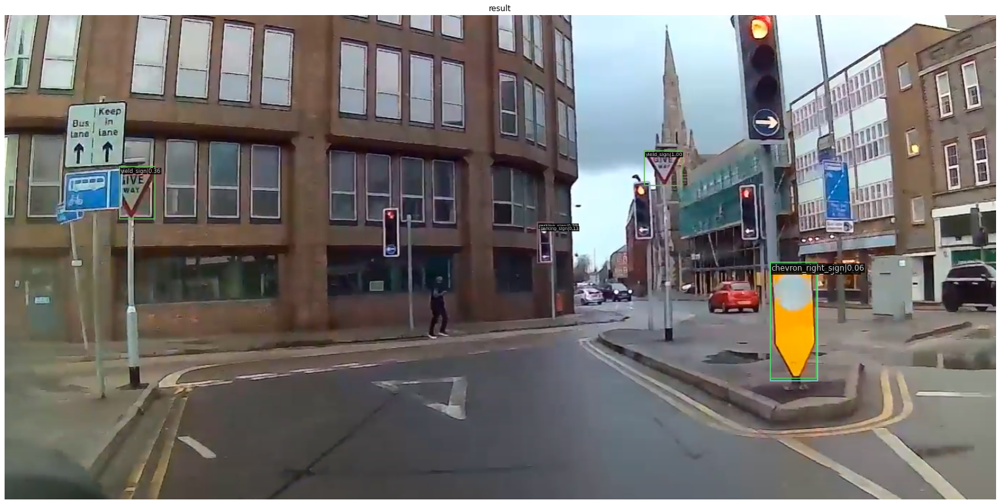

In [26]:
img = mmcv.imread('/content/drive/MyDrive/Group Coursework (80%)/TestPic.png')
result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr = 0.00)

# Frames prediction

In [ ]:
! unzip "/content/frames.zip"

Archive:  /content/frames.zip
   creating: frames/
  inflating: frames/frame0001.jpg    
  inflating: frames/frame0042.jpg    
  inflating: frames/frame0020.jpg    
  inflating: frames/frame0007.jpg    
  inflating: frames/frame0005.jpg    
  inflating: frames/frame0026.jpg    
  inflating: frames/frame0034.jpg    
  inflating: frames/frame0009.jpg    
  inflating: frames/frame0059.jpg    
  inflating: frames/frame0000.jpg    
  inflating: frames/frame0018.jpg    
  inflating: frames/frame0022.jpg    
  inflating: frames/frame0058.jpg    
  inflating: frames/frame0027.jpg    
  inflating: frames/frame0037.jpg    
  inflating: frames/frame0010.jpg    
  inflating: frames/frame0002.jpg    
  inflating: frames/frame0055.jpg    
  inflating: frames/frame0046.jpg    
  inflating: frames/frame0056.jpg    
  inflating: frames/frame0035.jpg    
  inflating: frames/frame0043.jpg    
  inflating: frames/frame0012.jpg    
  inflating: frames/frame0049.jpg    
  inflating: frames/frame0052.jpg    

In [ ]:
import mmcv
import os
# test a video and show the results
os.chdir("/content/")
output = {}
path = "/content/frames/"
frame_number = 0
frames = os.listdir(path)
frames.sort()
model.cfg = cfg

list_of_values = []

for frame in frames:
  img = mmcv.imread(path + "/" + frame)
  result = inference_detector(model, img)
  listFromArray = [classInstance.tolist() for classInstance in result]
  output[frame] = listFromArray


In [ ]:
!mkdir results

In [ ]:
# Return the IMG of the prediction
os.chdir("/content/")
output = {}
path = "/content/frames/"
frame_number = 0
frames = os.listdir(path)
frames.sort()
model.cfg = cfg

list_of_values = []

for frame in frames:
  img = mmcv.imread(path + "/" + frame)
  result = inference_detector(model, img)
  model.show_result(img, result, score_thr=0.01, out_file='results/' + frame)

In [ ]:
import imageio

path = "/content/results/"
images = []

for frame in frames:
    images.append(imageio.imread(path + frame))

imageio.mimsave('/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/result.gif', images)

In [ ]:
import json

json.dump(output, open("/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/output.json", "w"))

# FPS Benchmark

Move Configs to folder before
And Swap the paths to the config and checkpoint for the model to test

In [28]:
!python -m torch.distributed.launch --nproc_per_node=1 --master_port=29500 "/content/mmdetection/tools/analysis_tools/benchmark.py" \
       "/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py" \
       "/content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_15.pth" \
       --launcher pytorch

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:164: DeprecationWarning: The 'warn' method is deprecated, use 'warning' instead
  "The module torch.distributed.launch is deprecated "
The module torch.distributed.launch is deprecated and going to be removed in future.Migrate to torch.distributed.run
 Please read local_rank from `os.environ('LOCAL_RANK')` instead.
INFO:torch.distributed.launcher.api:Starting elastic_operator with launch configs:
  entrypoint       : /content/mmdetection/tools/analysis_tools/benchmark.py
  min_nodes        : 1
  max_nodes        : 1
  nproc_per_node   : 1
  run_id           : none
  rdzv_backend     : static
  rdzv_endpoint    : 127.0.0.1:29500
  rdzv_configs     : {'rank': 0, 'timeout': 900}
  max_restarts     : 3
  monitor_interval : 5
  log_dir          : None
  metrics_cfg      : {}

INFO:torch.distributed.elastic.agent.server.local_elastic_agent:log directory set to: /tmp/torchelastic_gwx6zrb0/none_v8b196ao
INFO:torch.distributed.e

#Testing the model from a variety of checkpoints (1, 5, 10, 15)



In [51]:
import mmcv
import os
import json
import imageio
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

#copy congfig if needed
#Faster RCNN
!cp "/content/drive/MyDrive/Group Coursework (80%)/Faster-RCNN_configV2.py" "/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py"
#DETR
!cp "/content/drive/MyDrive/Group Coursework (80%)/DETR_configV2.py" "/content/mmdetection/configs/detr/DETR_config.py"
#YOLO
!cp "/content/drive/MyDrive/Group Coursework (80%)/YOLO_configV2.py" "/content/mmdetection/configs/yolo/YOLO_config.py"


#load config file
#Faster RCNN
cfg = Config.fromfile("/content/mmdetection/configs/faster_rcnn/Faster-RCNN_config.py")
#DETR
# cfg = Config.fromfile("/content/mmdetection/configs/detr/DETR_config.py")
#YOLO
# cfg = Config.fromfile("/content/mmdetection/configs/yolo/YOLO_config.py")

#Set the dir to load pre-trained model
modelName = "Faster RCNN"# or "YOLO" or "DETR"
#Set the dir to save to
resultsDirectory = "Faster RCNN"# or "YOLO" or "DETR"


def make_results(ep, video_name):

    # Setup a checkpoint file to load
    checkpoint = f"/content/drive/MyDrive/Group Coursework (80%)/Models/{modelName}/epoch_{ep}.pth"

    # Set the device to be used for evaluation
    device='cuda:0'

    # Set pretrained to be None since we do not need pretrained model here
    cfg.model.pretrained = None

    # Initialize the detector
    model = build_detector(cfg.model)

    # Load checkpoint
    checkpoint = load_checkpoint(model, checkpoint, map_location=device)

    # Set the classes of models for inference
    model.CLASSES = checkpoint['meta']['CLASSES']

    # We need to set the model's cfg for inference
    model.cfg = cfg

    # Convert the model to GPU
    model.to(device)
    # Convert the model into evaluation mode
    model.eval()




    # test a video and show the results
    os.chdir("/content/")
    output = {}
    path = "/content/frames/"
    frame_number = 0
    frames = os.listdir(path)
    frames.sort()
    model.cfg = cfg

    list_of_values = []

    for frame in frames:
        img = mmcv.imread(path + "/" + frame)
        result = inference_detector(model, img)
        listFromArray = [classInstance.tolist() for classInstance in result]
        output[frame] = listFromArray

    json.dump(output, open(f"/content/drive/MyDrive/Group Coursework (80%)/Models/{resultsDirectory}/{video_name}_output_ep{ep}.json", "w"))

    # Return the IMG of the prediction
    os.chdir("/content/")
    output = {}
    path = "/content/frames/"
    frame_number = 0
    frames = os.listdir(path)
    frames.sort()
    model.cfg = cfg

    list_of_values = []

    for frame in frames:
        img = mmcv.imread(path + "/" + frame)
        result = inference_detector(model, img)
        model.show_result(img, result, score_thr=0.01, out_file='results/' + frame)

    path = "/content/results/"
    images = []

    for frame in frames:
        images.append(imageio.imread(path + frame))

    imageio.mimsave(f'/content/drive/MyDrive/Group Coursework (80%)/Models/{resultsDirectory}/{video_name}_result_ep{ep}.gif', images)

##30MPH_Dusk_Short

In [31]:
!rm -r frames
! unzip "/content/frames_30MPH_Dusk_Short.zip"

!rm -r results
!mkdir results

rm: cannot remove 'frames': No such file or directory
unzip:  cannot find or open /content/frames_30MPH_Dusk_Short.zip, /content/frames_30MPH_Dusk_Short.zip.zip or /content/frames_30MPH_Dusk_Short.zip.ZIP.
rm: cannot remove 'results': No such file or directory


load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_1.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_5.pth


KeyboardInterrupt: ignored

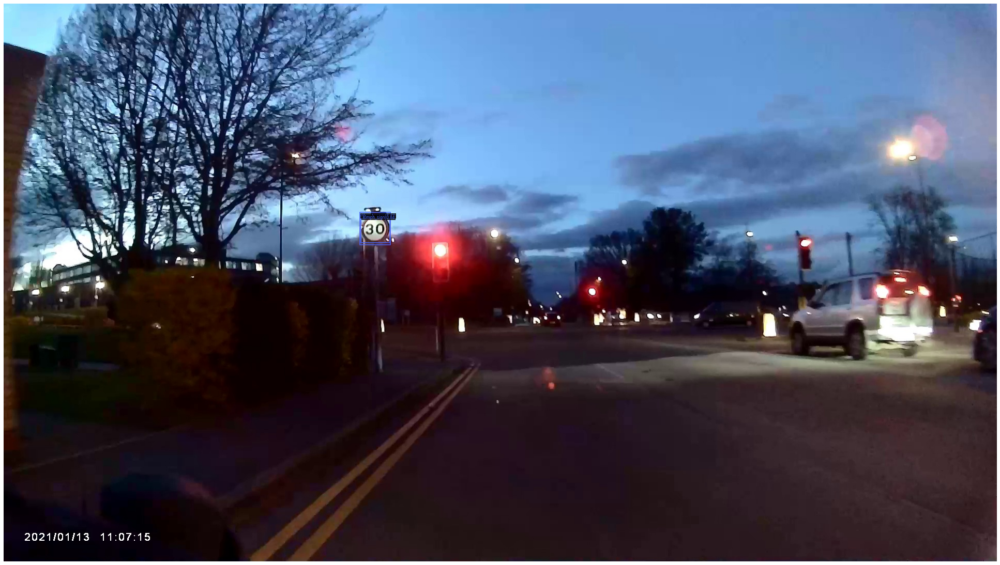

In [ ]:
video_name = '30MPH_Dusk_Short'
make_results('1', video_name)
make_results('5', video_name)
make_results('10', video_name)
make_results('15', video_name)

##GiveWay_NoRightTurn_NoWay_Dusk_Short

In [ ]:
!rm -r frames

! unzip "/content/frames_GiveWay_NoRightTurn_NoWay_Dusk_Short.zip"


!rm -r results
!mkdir results

Archive:  /content/frames_GiveWay_NoRightTurn_NoWay_Dusk_Short.zip
   creating: frames/
  inflating: frames/frame0023.jpg    
  inflating: frames/frame0011.jpg    
  inflating: frames/frame0018.jpg    
  inflating: frames/frame0030.jpg    
  inflating: frames/frame0025.jpg    
  inflating: frames/frame0050.jpg    
  inflating: frames/frame0022.jpg    
  inflating: frames/frame0034.jpg    
  inflating: frames/frame0046.jpg    
  inflating: frames/frame0036.jpg    
  inflating: frames/frame0021.jpg    
  inflating: frames/frame0026.jpg    
  inflating: frames/frame0055.jpg    
  inflating: frames/frame0028.jpg    
  inflating: frames/frame0040.jpg    
  inflating: frames/frame0043.jpg    
  inflating: frames/frame0019.jpg    
  inflating: frames/frame0044.jpg    
  inflating: frames/frame0014.jpg    
  inflating: frames/frame0038.jpg    
  inflating: frames/frame0002.jpg    
  inflating: frames/frame0045.jpg    
  inflating: frames/frame0031.jpg    
  inflating: frames/frame0047.jpg    


In [ ]:
video_name = 'GiveWay_NoRightTurn_NoWay_Dusk_Short'
make_results('1', video_name)
make_results('5', video_name)
make_results('10', video_name)
make_results('15', video_name)

load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_1.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_5.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_10.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_15.pth


##GiveWay_OneWay_Daylight_Short

In [ ]:
!rm -r frames

! unzip "/content/frames_GiveWay_OneWay_Daylight_Short.zip" -d '/content/'


!rm -r results
!mkdir results

In [53]:
video_name = 'GiveWay_OneWay_Daylight_Short'
make_results('1', video_name)
make_results('5', video_name)
make_results('10', video_name)
make_results('15', video_name)

load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_1.pth


/content/mmdetection/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_5.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_10.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/Faster RCNN/epoch_15.pth


##NoEntry_Daylight_Short

In [ ]:
!rm -r frames

! unzip "/content/frames_NoEntry_Daylight_Short.zip"

!rm -r results
!mkdir results

Archive:  /content/frames_NoEntry_Daylight_Short.zip
   creating: frames/
  inflating: frames/frame0001.jpg    
  inflating: frames/frame0042.jpg    
  inflating: frames/frame0020.jpg    
  inflating: frames/frame0007.jpg    
  inflating: frames/frame0005.jpg    
  inflating: frames/frame0026.jpg    
  inflating: frames/frame0034.jpg    
  inflating: frames/frame0009.jpg    
  inflating: frames/frame0059.jpg    
  inflating: frames/frame0000.jpg    
  inflating: frames/frame0018.jpg    
  inflating: frames/frame0022.jpg    
  inflating: frames/frame0058.jpg    
  inflating: frames/frame0027.jpg    
  inflating: frames/frame0037.jpg    
  inflating: frames/frame0010.jpg    
  inflating: frames/frame0002.jpg    
  inflating: frames/frame0055.jpg    
  inflating: frames/frame0046.jpg    
  inflating: frames/frame0056.jpg    
  inflating: frames/frame0035.jpg    
  inflating: frames/frame0043.jpg    
  inflating: frames/frame0012.jpg    
  inflating: frames/frame0049.jpg    
  inflating: f

In [ ]:
video_name = 'NoEntry_Daylight_Short'
make_results('1', video_name)
make_results('5', video_name)
make_results('10', video_name)
make_results('15', video_name)

load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_1.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_5.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_10.pth
load checkpoint from local path: /content/drive/MyDrive/Group Coursework (80%)/Models/DETR/epoch_15.pth
